### Imports

In [75]:
#import required modules
# = used package
import pandas as pd #
import numpy as np #
import pickle #
import matplotlib.pyplot as plt #
import seaborn as sns #
import patsy #
import statsmodels.api as sm #
import statsmodels.formula.api as smf #
import scipy.stats as stats #
from sklearn import model_selection #
from sklearn.linear_model import LinearRegression #
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV # ridge and lasso
from sklearn import preprocessing, linear_model, pipeline #
from sklearn import feature_selection #
from sklearn import metrics #
from sklearn.preprocessing import scale #not necessary?
%matplotlib inline

### Prepare DataFrame

In [76]:
#open pickle file of cleaned and processed data
with open("players_iqr_losses.pkl", 'rb') as picklefile: 
    df = pickle.load(picklefile)

In [77]:
#remove white space from column names for patsy
df.columns = df.columns.str.replace(' ','')
#rename columns with numbers in name for patsy
df = df.rename(columns={'1stServe':'FirstServe','1stServePointsWon':'FirstServePointsWon',
                        '1stServeReturnPointsWon':'FirstServeReturnPointsWon',
                        '2ndServePointsWon':'SecondServePointsWon',
                        '2ndServeReturnPointsWon':'SecondServeReturnPointsWon'})

In [78]:
df

,,FirstServe,FirstServePointsWon,FirstServeReturnPointsWon,SecondServePointsWon,SecondServeReturnPointsWon,Aces,BreakPointsConverted,BreakPointsFaced,BreakPointsOpportunities,BreakPointsSaved,...,ReturnPointsWon,ServiceGamesPlayed,ServiceGamesWon,TotalPointsWon,TotalServicePointsWon,Wins,Losses,Winnings,Ranking,log(Winnings)
Player,Year,,,,,,,,,,,,,,,,,,,,,
Pedro Sousa,2016,0.88,0.50,0.38,0.50,0.39,0,0.14,7,7,0.43,...,0.38,8,0.50,0.43,0.50,1,2,39820,119,10.592125
Roman Safiullin,2017,0.84,0.62,0.26,0.33,0.07,7,0.00,7,0,0.57,...,0.20,9,0.67,0.41,0.57,0,1,17334,381,9.760425
Pedro Sousa,2017,0.83,0.60,0.28,0.53,0.44,2,0.38,10,8,0.40,...,0.34,17,0.65,0.45,0.59,4,1,109827,119,11.606662
Rogerio Dutra Silva,2010,0.83,0.64,0.34,0.59,0.33,2,0.33,5,6,0.40,...,0.34,15,0.80,0.49,0.63,0,0,9761,125,9.186150
Daniel Gimeno-Traver,2017,0.81,0.54,0.00,0.33,0.33,1,0.00,2,0,0.50,...,0.20,2,0.50,0.35,0.50,0,1,32879,272,10.400589
Andres Artunedo Martinavarro,2014,0.77,0.67,0.09,0.55,0.40,3,0.50,6,2,0.50,...,0.26,9,0.67,0.44,0.64,0,1,10434,495,9.252825
Eduardo Struvay,2014,0.76,0.65,0.31,0.36,0.41,1,0.29,6,7,0.33,...,0.35,9,0.56,0.45,0.58,0,1,24218,1107T,10.094851
Riccardo Bellotti,2017,0.76,0.55,0.35,0.39,0.41,0,0.50,9,8,0.33,...,0.37,14,0.57,0.45,0.51,0,1,61154,432,11.021151
Austin Krajicek,2017,0.76,0.78,0.16,0.57,0.49,9,0.25,3,4,0.33,...,0.30,16,0.88,0.50,0.73,0,1,52940,291,10.876914


In [79]:
df.describe()

,FirstServe,FirstServePointsWon,FirstServeReturnPointsWon,SecondServePointsWon,SecondServeReturnPointsWon,Aces,BreakPointsConverted,BreakPointsFaced,BreakPointsOpportunities,BreakPointsSaved,...,ReturnGamesWon,ReturnPointsWon,ServiceGamesPlayed,ServiceGamesWon,TotalPointsWon,TotalServicePointsWon,Wins,Losses,Winnings,log(Winnings)
count,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,...,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1893.000000,1.893000e+03,1893.000000
mean,0.599847,0.686825,0.265293,0.484849,0.470317,131.630745,0.372805,133.817221,137.267829,0.572974,...,0.180497,0.345895,252.758584,0.727163,0.477702,0.605362,11.344955,10.230322,4.946483e+05,11.913552
std,0.053561,0.070743,0.055997,0.066242,0.067362,185.786928,0.156220,135.577051,164.933960,0.117041,...,0.082179,0.049511,276.873584,0.123888,0.038480,0.059002,15.178775,9.259975,1.222016e+06,1.609532
min,0.360000,0.270000,0.000000,0.060000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.220000,0.250000,0.000000,0.000000,1.080000e+02,4.682131
25%,0.570000,0.650000,0.240000,0.460000,0.440000,8.000000,0.330000,17.000000,11.000000,0.530000,...,0.130000,0.320000,25.000000,0.680000,0.460000,0.580000,1.000000,2.000000,5.552500e+04,10.924589
50%,0.600000,0.700000,0.270000,0.500000,0.480000,45.000000,0.380000,71.000000,56.000000,0.600000,...,0.190000,0.350000,118.000000,0.750000,0.490000,0.610000,4.000000,6.000000,1.537160e+05,11.942862
75%,0.630000,0.730000,0.300000,0.520000,0.510000,186.000000,0.430000,243.000000,233.000000,0.640000,...,0.230000,0.380000,449.000000,0.800000,0.500000,0.640000,18.000000,19.000000,4.639040e+05,13.047433
max,0.880000,0.890000,0.480000,0.920000,0.750000,1447.000000,1.000000,541.000000,825.000000,1.000000,...,0.560000,0.510000,1139.000000,1.000000,0.820000,0.820000,82.000000,36.000000,1.826712e+07,16.720614


(array([1176.,  212.,  160.,  139.,   93.,   52.,   27.,   18.,    9.,
           7.]),
 array([ 0. ,  8.2, 16.4, 24.6, 32.8, 41. , 49.2, 57.4, 65.6, 73.8, 82. ]),
 <a list of 10 Patch objects>)

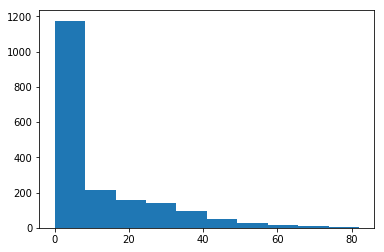

In [80]:
plt.hist(df.Wins)

### Prepare Features and Independent Variables (Outcomes)

In [81]:
## create lists of features and outcomes used in modeling.
features = list(df.columns)[0:18]
outcomes = list(df.columns)[18:21]
outcomes.append(list(df.columns)[22])
wins = outcomes[0]
losses = outcomes[1]
#first looking at winnings for modeling
winnings = outcomes[2]
log_winnings = outcomes[3]

In [82]:
#all features
features

['FirstServe',
 'FirstServePointsWon',
 'FirstServeReturnPointsWon',
 'SecondServePointsWon',
 'SecondServeReturnPointsWon',
 'Aces',
 'BreakPointsConverted',
 'BreakPointsFaced',
 'BreakPointsOpportunities',
 'BreakPointsSaved',
 'DoubleFaults',
 'ReturnGamesPlayed',
 'ReturnGamesWon',
 'ReturnPointsWon',
 'ServiceGamesPlayed',
 'ServiceGamesWon',
 'TotalPointsWon',
 'TotalServicePointsWon']

In [83]:
#all outcomes
outcomes

['Wins', 'Losses', 'Winnings', 'log(Winnings)']

### Correlations

In [84]:
#correlations of all features and outcomes with each other
df.corr()

,FirstServe,FirstServePointsWon,FirstServeReturnPointsWon,SecondServePointsWon,SecondServeReturnPointsWon,Aces,BreakPointsConverted,BreakPointsFaced,BreakPointsOpportunities,BreakPointsSaved,...,ReturnGamesWon,ReturnPointsWon,ServiceGamesPlayed,ServiceGamesWon,TotalPointsWon,TotalServicePointsWon,Wins,Losses,Winnings,log(Winnings)
FirstServe,1.000000,-0.037610,0.044397,0.129069,0.015073,0.103565,-0.012026,0.093297,0.114248,0.113844,...,0.017789,0.026949,0.122830,0.166012,0.179111,0.209791,0.127021,0.070960,0.120277,0.144996
FirstServePointsWon,-0.037610,1.000000,0.062296,0.366138,0.030834,0.519732,-0.026770,0.358232,0.384552,0.440783,...,0.039492,0.043313,0.445160,0.832150,0.671347,0.871445,0.415174,0.372359,0.260877,0.453193
FirstServeReturnPointsWon,0.044397,0.062296,1.000000,0.118209,0.341991,0.171772,0.334372,0.356485,0.379064,0.079765,...,0.774065,0.845211,0.324796,0.136560,0.529215,0.104170,0.326540,0.270758,0.239939,0.340993
SecondServePointsWon,0.129069,0.366138,0.118209,1.000000,0.141841,0.335783,0.066891,0.326167,0.357624,0.375014,...,0.151254,0.145567,0.377698,0.675248,0.651275,0.732198,0.357380,0.292556,0.262289,0.404765
SecondServeReturnPointsWon,0.015073,0.030834,0.341991,0.141841,1.000000,0.128091,0.277595,0.298705,0.322628,0.099097,...,0.631956,0.744823,0.275033,0.134667,0.444183,0.098392,0.273594,0.214326,0.217982,0.301573
Aces,0.103565,0.519732,0.171772,0.335783,0.128091,1.000000,0.047248,0.718332,0.751074,0.341451,...,0.179882,0.174797,0.853296,0.501343,0.494432,0.547979,0.802944,0.703197,0.492243,0.697038
BreakPointsConverted,-0.012026,-0.026770,0.334372,0.066891,0.277595,0.047248,1.000000,0.121351,0.116201,-0.004946,...,0.556715,0.394760,0.107539,-0.007648,0.263351,0.010650,0.105881,0.075886,0.078280,0.101243
BreakPointsFaced,0.093297,0.358232,0.356485,0.326167,0.298705,0.718332,0.121351,1.000000,0.947051,0.318404,...,0.415882,0.402968,0.957175,0.418055,0.545471,0.424015,0.860347,0.914944,0.491725,0.807704
BreakPointsOpportunities,0.114248,0.384552,0.379064,0.357624,0.322628,0.751074,0.116201,0.947051,1.000000,0.301283,...,0.451456,0.431744,0.972380,0.440377,0.584077,0.460843,0.951722,0.802702,0.679154,0.816674
BreakPointsSaved,0.113844,0.440783,0.079765,0.375014,0.099097,0.341451,-0.004946,0.318404,0.301283,1.000000,...,0.084191,0.088473,0.335639,0.548363,0.494975,0.511262,0.309476,0.284637,0.202863,0.363844


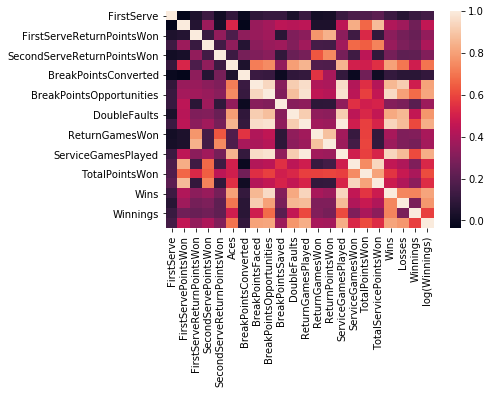

In [85]:
sns.heatmap(df.corr())

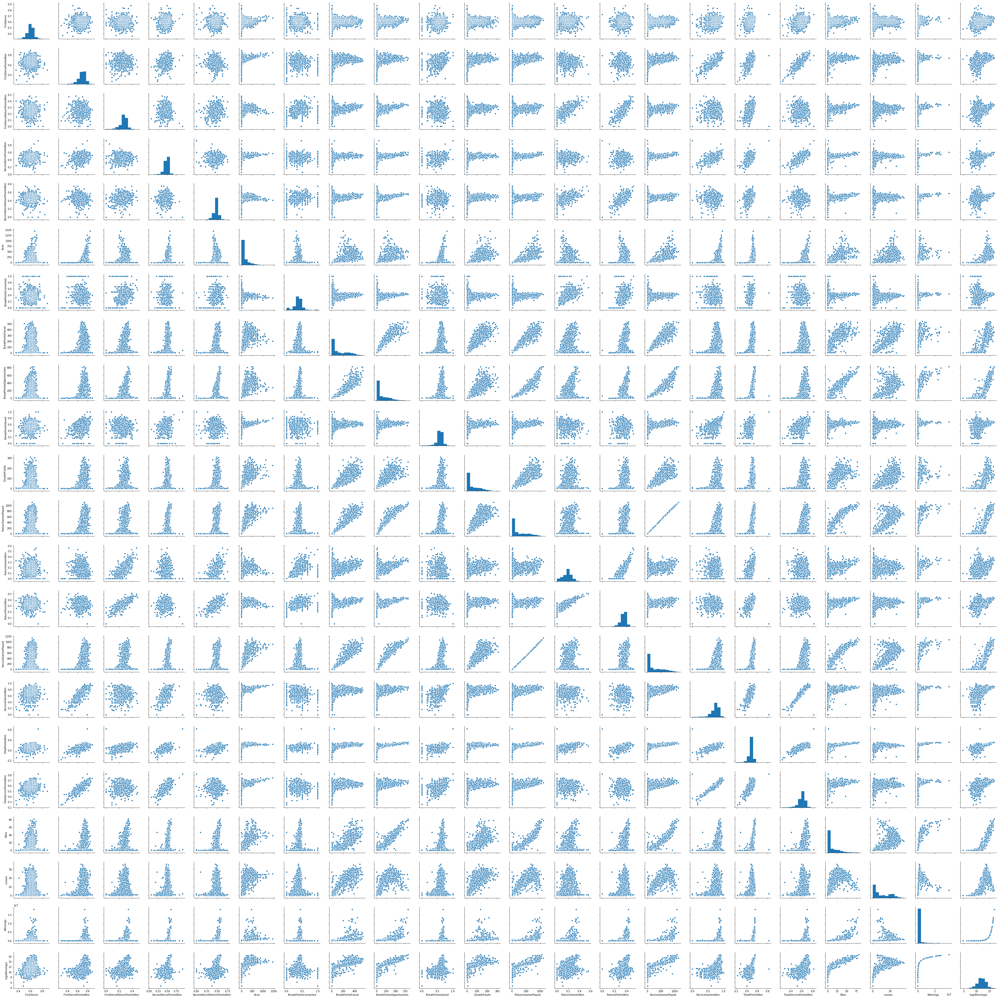

In [86]:
#pair plot to look at distributions of features and outcomes
colors = sns.hls_palette(2)
sns.pairplot(df)

## Modeling

### Model 1 - statsmodels(sm) all features, predicting losses

In [87]:
#convert column names to string for patsy
str = ""
for feat in features:
    str+= feat + " + "
str

'FirstServe + FirstServePointsWon + FirstServeReturnPointsWon + SecondServePointsWon + SecondServeReturnPointsWon + Aces + BreakPointsConverted + BreakPointsFaced + BreakPointsOpportunities + BreakPointsSaved + DoubleFaults + ReturnGamesPlayed + ReturnGamesWon + ReturnPointsWon + ServiceGamesPlayed + ServiceGamesWon + TotalPointsWon + TotalServicePointsWon + '

In [88]:
#create design matrix with intercept using patsy
y,X = patsy.dmatrices('Wins ~ FirstServe + FirstServePointsWon + FirstServeReturnPointsWon\
+ SecondServePointsWon + SecondServeReturnPointsWon + Aces + BreakPointsConverted + BreakPointsFaced\
+ BreakPointsOpportunities + BreakPointsSaved + DoubleFaults + ReturnGamesPlayed + ReturnGamesWon\
+ ReturnPointsWon + ServiceGamesPlayed + ServiceGamesWon + TotalPointsWon + TotalServicePointsWon',data=df,return_type='dataframe')

In [89]:
#split the data into training and testing groups
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)

In [90]:
#run first regression model with statsmodels on all data
model_1=sm.OLS(y_train,X_train)
fit_1 = model_1.fit()
fit_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   Wins   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     1611.
Date:                Fri, 27 Apr 2018   Prob (F-statistic):               0.00
Time:                        06:16:48   Log-Likelihood:                -3366.8
No. Observations:                1325   AIC:                             6772.
Df Residuals:                    1306   BIC:                             6870.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      0.4067      3.200      0.127      0.899      -5.871       6.684
FirstServe                     3.9591      3.262      1.214      0.225      -2.439      10.357
FirstServePointsWon            7.5364      8.467      0.890      0.374      -9.074      24.147
FirstServeReturnPointsWon     -1.7792      4.818     -0.369      0.712     -11.232       7.674
SecondServePointsWon           4.1812      5.777      0.724      0.469      -7.152      15.515
SecondServeReturnPointsWon    -0.3811      3.201     -0.119      0.905      -6.661       5.898
Aces                           0.0033      0.002      1.942      0.052    -3.4e-05       0.007
BreakPointsConverted           1.5673      0.707      2.217      0.027       0.181       2.954
BreakPointsFaced              -0.0654      0.004    -17.029      0.000      -0.073      -0.058
BreakPointsOpportunities       0.0829      0.003     24.790      0.000       0.076       0.089
BreakPointsSaved               2.7926      1.010      2.765      0.006       0.811       4.774
DoubleFaults                  -0.0062      0.004     -1.657      0.098      -0.014       0.001
ReturnGamesPlayed             -0.0415      0.018     -2.260      0.024      -0.078      -0.005
ReturnGamesWon                 0.3756      2.861      0.131      0.896      -5.236       5.987
ReturnPointsWon              -10.2107      9.818     -1.040      0.299     -29.471       9.050
ServiceGamesPlayed             0.0755      0.018      4.159      0.000       0.040       0.111
ServiceGamesWon                1.7251      2.997      0.576      0.565      -4.155       7.605
TotalPointsWon                16.8326     16.719      1.007      0.314     -15.966      49.631
TotalServicePointsWon        -28.8265     15.327     -1.881      0.060     -58.896       1.243
==============================================================================
Omnibus:                     1004.334   Durbin-Watson:                   2.008
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           149228.465
Skew:                          -2.645   Prob(JB):                         0.00
Kurtosis:                      54.721   Cond. No.                     1.47e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.47e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0.5,1,'Residuals of Train Data')

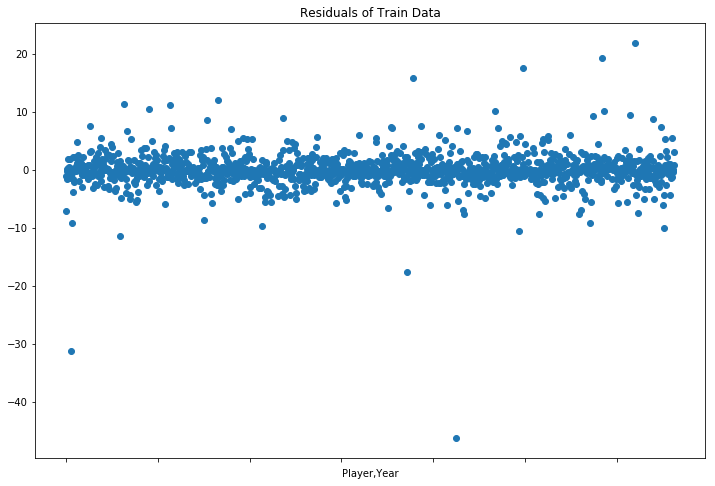

In [91]:
#residual plot on training data
fit_1.resid.plot(style='o',figsize=(12,8))
plt.title('Residuals of Train Data')

In [92]:
#predict of test data
pred_1 = fit_1.predict(X_test)

In [93]:
#find residuals on test data
resid_1 = np.array(y_test['Wins']) - pred_1

((array([-3.03078725e+00, -2.75215267e+00, -2.59571776e+00, -2.48491541e+00,
         -2.39817285e+00, -2.32642380e+00, -2.26496514e+00, -2.21103109e+00,
         -2.16285219e+00, -2.11922549e+00, -2.07929460e+00, -2.04242748e+00,
         -2.00814381e+00, -1.97606975e+00, -1.94590841e+00, -1.91741990e+00,
         -1.89040755e+00, -1.86470804e+00, -1.84018416e+00, -1.81671952e+00,
         -1.79421452e+00, -1.77258318e+00, -1.75175080e+00, -1.73165205e+00,
         -1.71222942e+00, -1.69343202e+00, -1.67521462e+00, -1.65753680e+00,
         -1.64036229e+00, -1.62365844e+00, -1.60739571e+00, -1.59154731e+00,
         -1.57608888e+00, -1.56099815e+00, -1.54625476e+00, -1.53184002e+00,
         -1.51773672e+00, -1.50392900e+00, -1.49040220e+00, -1.47714273e+00,
         -1.46413800e+00, -1.45137628e+00, -1.43884664e+00, -1.42653891e+00,
         -1.41444356e+00, -1.40255166e+00, -1.39085487e+00, -1.37934533e+00,
         -1.36801567e+00, -1.35685894e+00, -1.34586859e+00, -1.33503844e+00,

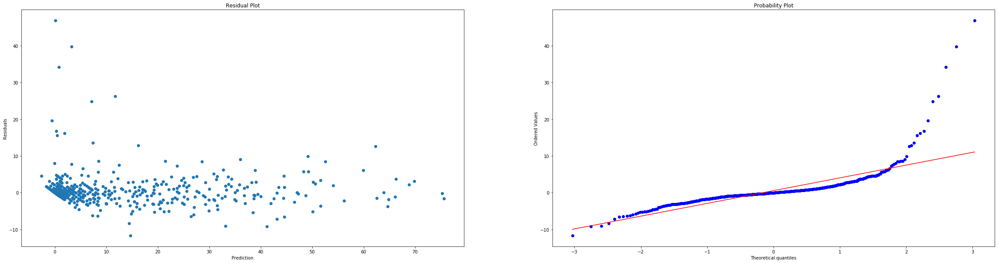

In [94]:
#Testing plots of residuals and probability plot
plt.figure(figsize=(40,10))
plt.xlim(1,22000000)
plt.subplot(1,2,1)
plt.scatter(pred_1,resid_1)
plt.title('Residual Plot')
plt.xlabel('Prediction')
plt.ylabel('Residuals')

plt.subplot(1,2,2)
stats.probplot(resid_1,dist='norm',plot=plt)

### Model 2 - statsmodels (smf) all features, predicting losses

In [95]:
#look at all features and set winning to predicted variable
X = df.loc[:,features]
y = df.loc[:,wins]

In [96]:
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)
Xy_train = X_train.copy()
Xy_train['Wins'] = y_train

In [97]:
#stats model with no patsy
model_2 = smf.ols('Wins ~ FirstServe + FirstServePointsWon + FirstServeReturnPointsWon\
+ SecondServePointsWon + SecondServeReturnPointsWon + Aces + BreakPointsConverted + BreakPointsFaced\
+ BreakPointsOpportunities + BreakPointsSaved + DoubleFaults + ReturnGamesPlayed + ReturnGamesWon\
+ ReturnPointsWon + ServiceGamesPlayed + ServiceGamesWon + TotalPointsWon + TotalServicePointsWon',data=Xy_train)
fit_2 = model_2.fit()
fit_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   Wins   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.947
Method:                 Least Squares   F-statistic:                     1310.
Date:                Fri, 27 Apr 2018   Prob (F-statistic):               0.00
Time:                        06:16:49   Log-Likelihood:                -3486.3
No. Observations:                1325   AIC:                             7011.
Df Residuals:                    1306   BIC:                             7109.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      2.8432      2.890      0.984      0.325      -2.826       8.512
FirstServe                     1.0399      3.573      0.291      0.771      -5.970       8.050
FirstServePointsWon           -0.1569      9.253     -0.017      0.986     -18.309      17.995
FirstServeReturnPointsWon     -4.9662      5.354     -0.928      0.354     -15.469       5.536
SecondServePointsWon          -0.7575      6.283     -0.121      0.904     -13.084      11.569
SecondServeReturnPointsWon    -3.0452      3.520     -0.865      0.387      -9.951       3.860
Aces                           0.0017      0.002      0.913      0.361      -0.002       0.005
BreakPointsConverted           1.3653      0.803      1.701      0.089      -0.210       2.940
BreakPointsFaced              -0.0711      0.004    -16.308      0.000      -0.080      -0.063
BreakPointsOpportunities       0.0825      0.004     21.541      0.000       0.075       0.090
BreakPointsSaved               3.7870      1.074      3.526      0.000       1.680       5.894
DoubleFaults                  -0.0048      0.004     -1.120      0.263      -0.013       0.004
ReturnGamesPlayed             -0.0529      0.020     -2.631      0.009      -0.092      -0.013
ReturnGamesWon                 1.4280      3.174      0.450      0.653      -4.799       7.655
ReturnPointsWon                1.7925      9.429      0.190      0.849     -16.705      20.290
ServiceGamesPlayed             0.0898      0.020      4.521      0.000       0.051       0.129
ServiceGamesWon                0.7266      2.668      0.272      0.785      -4.507       5.961
TotalPointsWon                 0.1368     10.855      0.013      0.990     -21.159      21.433
TotalServicePointsWon         -6.9914     16.435     -0.425      0.671     -39.234      25.251
==============================================================================
Omnibus:                      527.294   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           121423.589
Skew:                          -0.616   Prob(JB):                         0.00
Kurtosis:                      49.881   Cond. No.                     1.31e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.31e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0.5,1,'Residuals of Train Data')

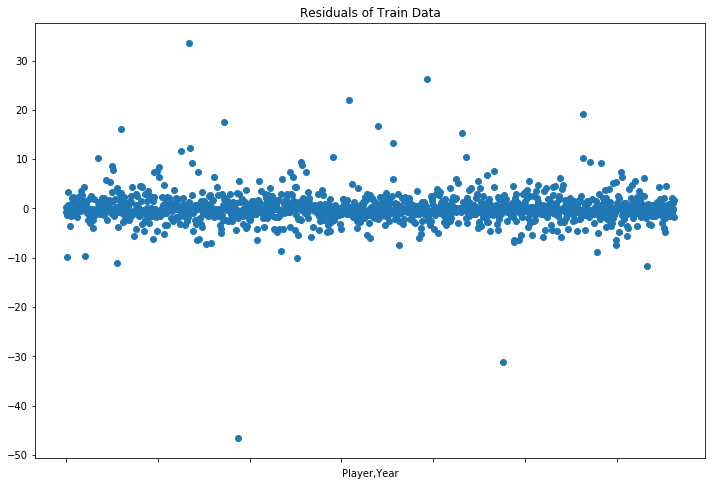

In [98]:
#training residuals
fit_2.resid.plot(style='o',figsize=(12,8))
plt.title('Residuals of Train Data')

In [99]:
#predictions and residuals on test data
pred_2 = fit_2.predict(X_test)
resid_2 = np.array(y_test) - pred_2

((array([-3.03078725e+00, -2.75215267e+00, -2.59571776e+00, -2.48491541e+00,
         -2.39817285e+00, -2.32642380e+00, -2.26496514e+00, -2.21103109e+00,
         -2.16285219e+00, -2.11922549e+00, -2.07929460e+00, -2.04242748e+00,
         -2.00814381e+00, -1.97606975e+00, -1.94590841e+00, -1.91741990e+00,
         -1.89040755e+00, -1.86470804e+00, -1.84018416e+00, -1.81671952e+00,
         -1.79421452e+00, -1.77258318e+00, -1.75175080e+00, -1.73165205e+00,
         -1.71222942e+00, -1.69343202e+00, -1.67521462e+00, -1.65753680e+00,
         -1.64036229e+00, -1.62365844e+00, -1.60739571e+00, -1.59154731e+00,
         -1.57608888e+00, -1.56099815e+00, -1.54625476e+00, -1.53184002e+00,
         -1.51773672e+00, -1.50392900e+00, -1.49040220e+00, -1.47714273e+00,
         -1.46413800e+00, -1.45137628e+00, -1.43884664e+00, -1.42653891e+00,
         -1.41444356e+00, -1.40255166e+00, -1.39085487e+00, -1.37934533e+00,
         -1.36801567e+00, -1.35685894e+00, -1.34586859e+00, -1.33503844e+00,

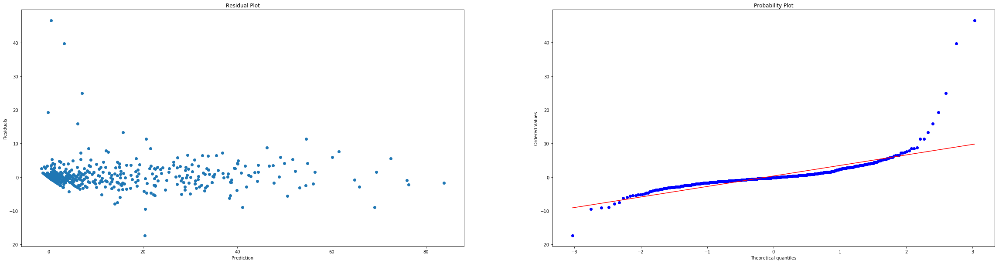

In [100]:
#Testing plots of residuals and probability plot
plt.figure(figsize=(40,10))
plt.xlim(1,22000000)
plt.subplot(1,2,1)
plt.scatter(pred_2,resid_2)
plt.title('Residual Plot')
plt.xlabel('Prediction')
plt.ylabel('Residuals')

plt.subplot(1,2,2)
stats.probplot(resid_2,dist='norm',plot=plt)

### Model 3 - sklearn all features, predicting losses

In [101]:
#done earleir for SMF model
X = df.loc[:,features]
y = df.loc[:,wins]

In [102]:
#done earlier for smf model
#split the data into training and testing groups
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)

In [103]:
lr1 = LinearRegression()
lr1.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [104]:
lr1.score(X_train,y_train)

0.9449655130384381

In [105]:
lr1.score(X_test,y_test)

0.9459756523564838

In [106]:
predict_3 = lr1.predict(X_test)

Text(0,0.5,'Residuals')

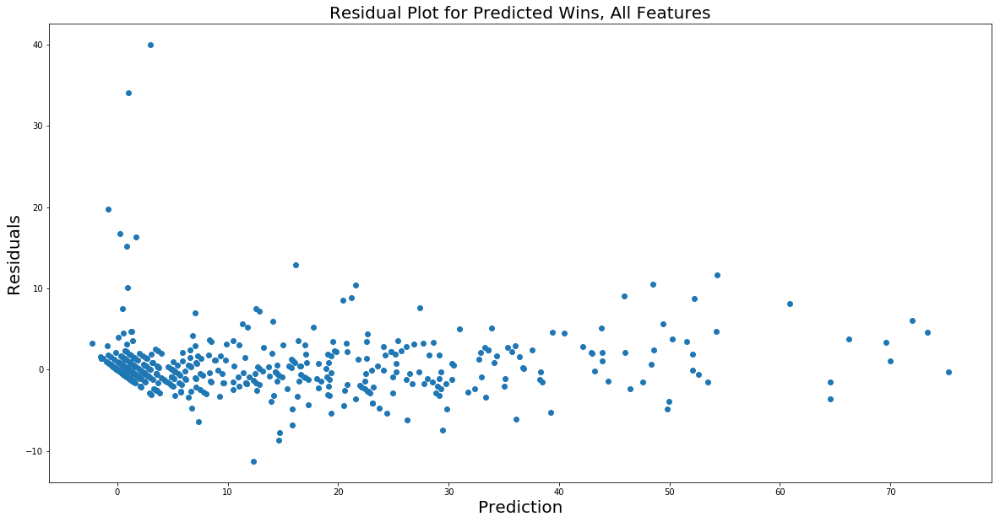

In [107]:
#Testing plots of residuals and probability plot
plt.figure(figsize=(20,10))
res = y_test - predict_3
plt.scatter(predict_3,res)
plt.title('Residual Plot for Predicted Wins, All Features',fontsize=20)
plt.xlabel('Prediction',fontsize=20)
plt.ylabel('Residuals',fontsize=20)

((array([-3.03078725e+00, -2.75215267e+00, -2.59571776e+00, -2.48491541e+00,
         -2.39817285e+00, -2.32642380e+00, -2.26496514e+00, -2.21103109e+00,
         -2.16285219e+00, -2.11922549e+00, -2.07929460e+00, -2.04242748e+00,
         -2.00814381e+00, -1.97606975e+00, -1.94590841e+00, -1.91741990e+00,
         -1.89040755e+00, -1.86470804e+00, -1.84018416e+00, -1.81671952e+00,
         -1.79421452e+00, -1.77258318e+00, -1.75175080e+00, -1.73165205e+00,
         -1.71222942e+00, -1.69343202e+00, -1.67521462e+00, -1.65753680e+00,
         -1.64036229e+00, -1.62365844e+00, -1.60739571e+00, -1.59154731e+00,
         -1.57608888e+00, -1.56099815e+00, -1.54625476e+00, -1.53184002e+00,
         -1.51773672e+00, -1.50392900e+00, -1.49040220e+00, -1.47714273e+00,
         -1.46413800e+00, -1.45137628e+00, -1.43884664e+00, -1.42653891e+00,
         -1.41444356e+00, -1.40255166e+00, -1.39085487e+00, -1.37934533e+00,
         -1.36801567e+00, -1.35685894e+00, -1.34586859e+00, -1.33503844e+00,

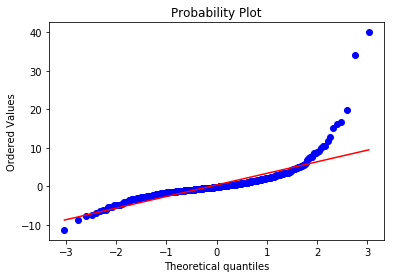

In [108]:
stats.probplot(res,dist='norm',plot=plt)

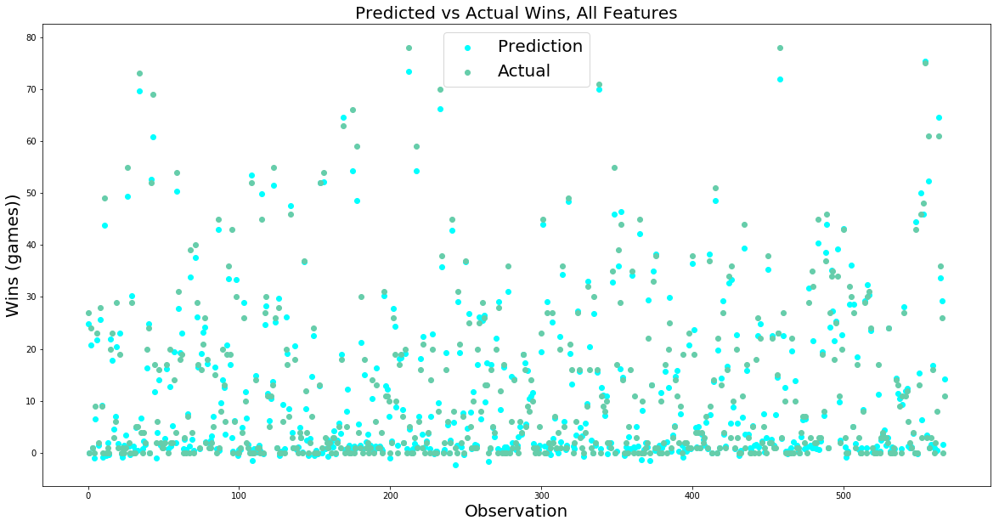

In [109]:
index = [i for i in range(len(predict_3))]
plt.figure(figsize=(20,10))
plt.rcParams['figure.dpi'] = 400
plt.scatter(index,predict_3,label='Prediction',c='#00FFFF')
plt.scatter(index,y_test,label='Actual',c='#66CDAA')
plt.title('Predicted vs Actual Wins, All Features',fontsize = 20)
plt.xlabel('Observation',fontsize = 20)
plt.ylabel('Wins (games))',fontsize = 20)
plt.legend(fontsize = 20)

In [110]:
#plot residuals vs features
plt.figure(figsize=(30,40))
for i,feat in enumerate(features):
    plt.subplot(6,3,i+1)
    plt.scatter(X_test[feat],res)
    plt.title(f'Residual vs {feat} Plot')
    plt.xlabel(f'{feat}')
    plt.ylabel('Residuals')

### Model 4 - sklearn selected features, predicting losses

In [111]:
selected_features = ['FirstServe',
 'FirstServePointsWon',
 'FirstServeReturnPointsWon',
 'SecondServePointsWon',
 'SecondServeReturnPointsWon',
 'Aces',
 'BreakPointsConverted',
 'BreakPointsFaced',
 'BreakPointsOpportunities',
 'BreakPointsSaved',
 'DoubleFaults',
 'ReturnGamesWon',
 'ReturnPointsWon',
 'ServiceGamesWon',
 'TotalServicePointsWon']

In [112]:
X = df.loc[:,selected_features]
y = df.loc[:,wins]

In [113]:
#split into training and testing data
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)

In [114]:
#create model and fit to training data
lr4 = LinearRegression()
lr4.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [115]:
#score on training data
lr4.score(X_train,y_train)

0.9454982447440159

In [116]:
#score on testing data
lr4.score(X_test,y_test)

0.9322273655903461

In [117]:
#predict on train
predict_6_train = lr4.predict(X_train)

In [118]:
#predict on test data
predict_6 = lr4.predict(X_test)

In [119]:
#R^2 train calc by hand -- validating the score
r_2_train = 1-np.sum((predict_6_train-y_train)**2)/np.sum((y_train-np.mean(y_train))**2)
r_2_train

0.9454982447440159

In [120]:
#R^2 test calculated by hand -- validating the score
r_2_test = 1-np.sum((predict_6-y_test)**2)/np.sum((y_test-np.mean(y_test))**2)
r_2_test

0.9322273655903461

Text(0,0.5,'Residuals')

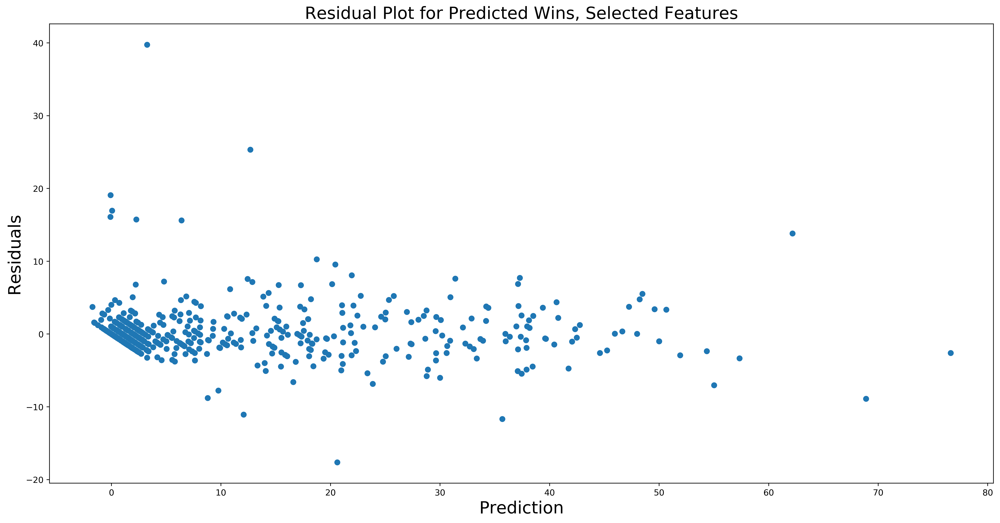

In [121]:
#Testing plots of residuals and probability plot
plt.figure(figsize=(20,10))
res = y_test - predict_6
plt.scatter(predict_6,res)
plt.title('Residual Plot for Predicted Wins, Selected Features',fontsize=20)
plt.xlabel('Prediction',fontsize=20)
plt.ylabel('Residuals',fontsize=20)

((array([-3.03078725e+00, -2.75215267e+00, -2.59571776e+00, -2.48491541e+00,
         -2.39817285e+00, -2.32642380e+00, -2.26496514e+00, -2.21103109e+00,
         -2.16285219e+00, -2.11922549e+00, -2.07929460e+00, -2.04242748e+00,
         -2.00814381e+00, -1.97606975e+00, -1.94590841e+00, -1.91741990e+00,
         -1.89040755e+00, -1.86470804e+00, -1.84018416e+00, -1.81671952e+00,
         -1.79421452e+00, -1.77258318e+00, -1.75175080e+00, -1.73165205e+00,
         -1.71222942e+00, -1.69343202e+00, -1.67521462e+00, -1.65753680e+00,
         -1.64036229e+00, -1.62365844e+00, -1.60739571e+00, -1.59154731e+00,
         -1.57608888e+00, -1.56099815e+00, -1.54625476e+00, -1.53184002e+00,
         -1.51773672e+00, -1.50392900e+00, -1.49040220e+00, -1.47714273e+00,
         -1.46413800e+00, -1.45137628e+00, -1.43884664e+00, -1.42653891e+00,
         -1.41444356e+00, -1.40255166e+00, -1.39085487e+00, -1.37934533e+00,
         -1.36801567e+00, -1.35685894e+00, -1.34586859e+00, -1.33503844e+00,

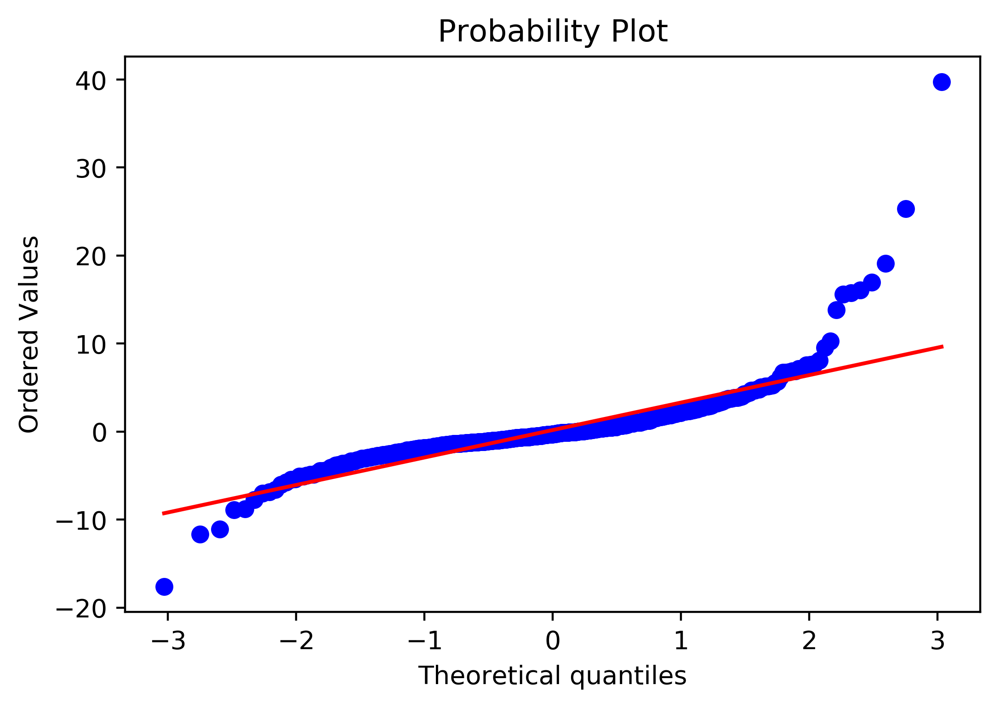

In [122]:
stats.probplot(res,dist='norm',plot=plt)

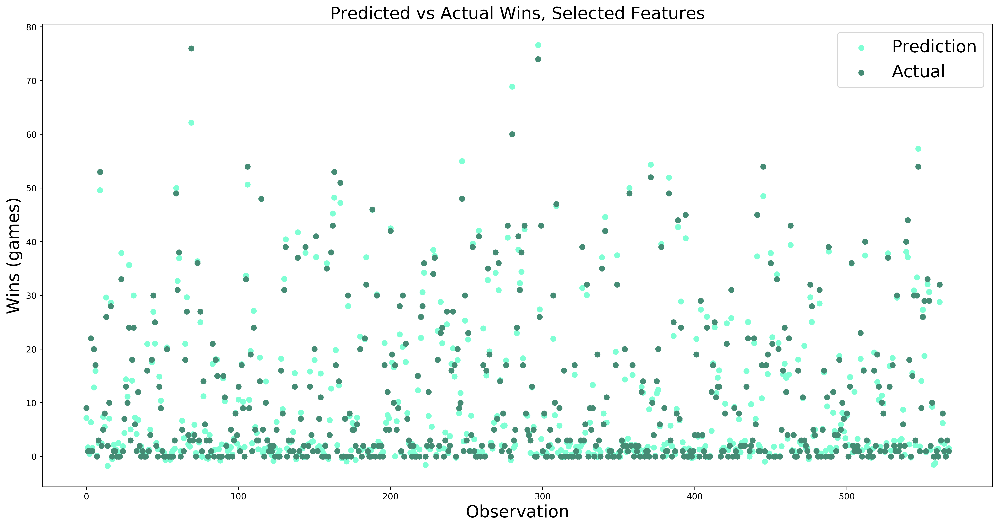

In [123]:
index = [i for i in range(len(predict_6))]
plt.figure(figsize=(20,10))
plt.rcParams['figure.dpi'] = 400
plt.scatter(index,predict_6,label='Prediction',c='#7FFFD4')
plt.scatter(index,y_test,label='Actual',c='#458B74')
plt.title('Predicted vs Actual Wins, Selected Features',fontsize = 20)
plt.xlabel('Observation',fontsize = 20)
plt.ylabel('Wins (games)',fontsize = 20)
plt.legend(fontsize = 20)

In [124]:
#plot residuals vs features
plt.figure(figsize=(30,40))
for i,feat in enumerate(selected_features):
    plt.subplot(6,3,i+1)
    plt.scatter(X_test[feat],res)
    plt.title(f'Residual vs {feat} Plot')
    plt.xlabel(f'{feat}')
    plt.ylabel('Residuals')

### Model 5 - sklearn selected features, predicting losses, k=10 folds cross validation

In [167]:
selected_features = ['FirstServe',
 'FirstServePointsWon',
 'FirstServeReturnPointsWon',
 'SecondServePointsWon',
 'SecondServeReturnPointsWon',
 'Aces',
 'BreakPointsConverted',
 'BreakPointsFaced',
 'BreakPointsOpportunities',
 'BreakPointsSaved',
 'DoubleFaults',
 'ReturnGamesWon',
 'ReturnPointsWon',
 'ServiceGamesWon',
 'TotalServicePointsWon']

In [168]:
X = df.loc[:,selected_features]
y = df.loc[:,wins]

In [169]:
#set up k folds CV with k=10
k_folds = model_selection.KFold(n_splits=10,shuffle=True)

In [170]:
#10-fold cross validation with scores
lr7 = LinearRegression()
scores = model_selection.cross_val_score(lr7,X,y,cv=k_folds,scoring='r2')
print(scores)

[0.92980521 0.90091328 0.96736894 0.8727254  0.96198607 0.95700147
 0.95722075 0.96563515 0.9653088  0.91241055]


In [171]:
#average score from k=10 folds
np.mean(scores)

0.9390375621505539

In [163]:
#predict on k-folds
predict_7 = model_selection.cross_val_predict(lr7,X,y,cv=k_folds)

In [164]:
resid_7 = predict_7-y

Text(0,0.5,'Residuals')

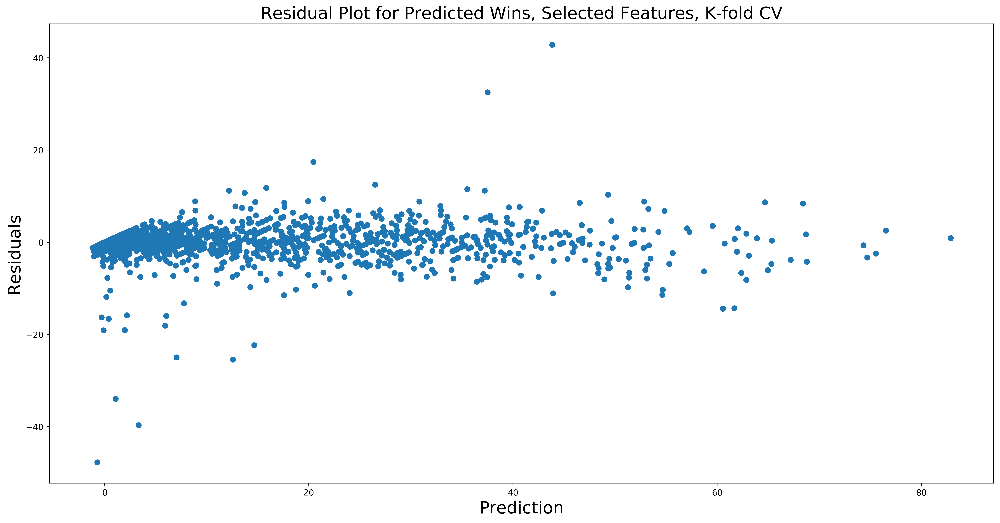

In [165]:
#Testing plots of residuals and probability plot
plt.figure(figsize=(20,10))
plt.scatter(predict_7,resid_7)
plt.title('Residual Plot for Predicted Wins, Selected Features, K-fold CV',fontsize=20)
plt.xlabel('Prediction',fontsize=20)
plt.ylabel('Residuals',fontsize=20)

((array([-3.37723202, -3.12513099, -2.98523781, ...,  2.98523781,
          3.12513099,  3.37723202]),
  array([-47.72172476, -39.67663867, -33.93994892, ...,  17.44280132,
          32.51095135,  42.83844759])),
 (3.104814680930303, 0.0021819766220729227, 0.8397273350400668))

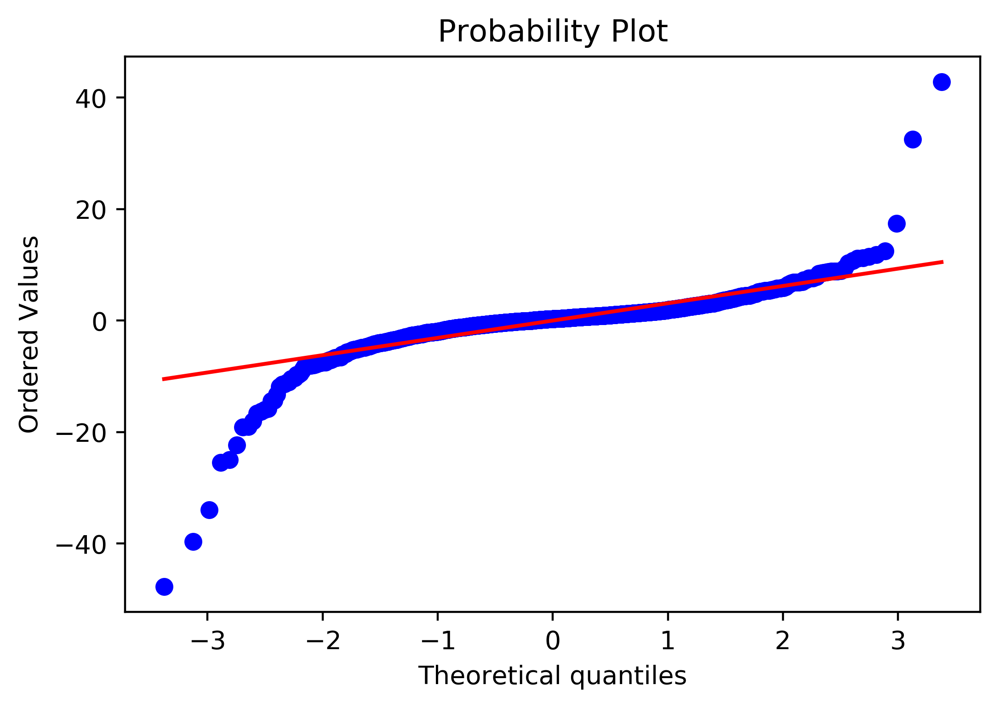

In [166]:
stats.probplot(resid_7,dist='norm',plot=plt)

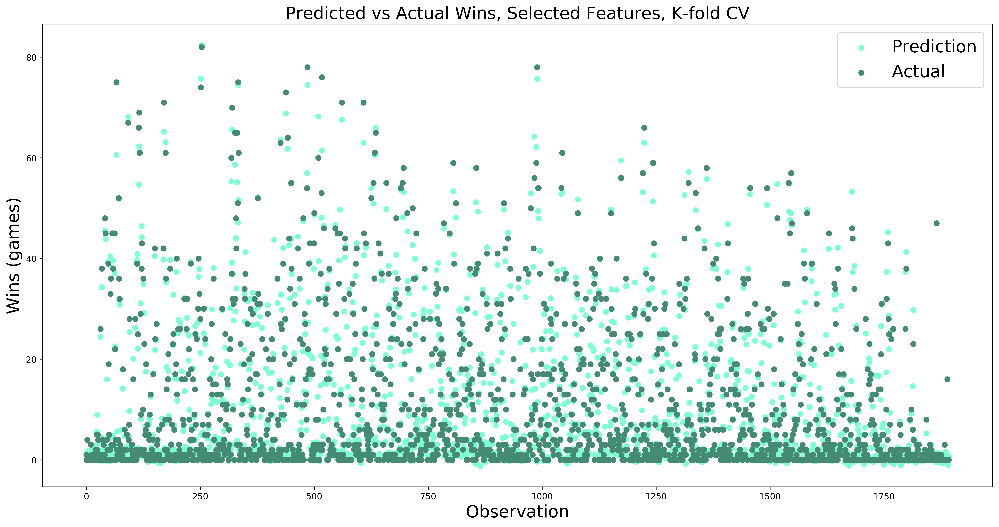

In [134]:
index = [i for i in range(len(predict_7))]
plt.figure(figsize=(20,10))
plt.rcParams['figure.dpi'] = 400
plt.scatter(index,predict_7,label='Prediction',c='#7FFFD4')
plt.scatter(index,y,label='Actual',c='#458B74')
plt.title('Predicted vs Actual Wins, Selected Features, K-fold CV',fontsize = 20)
plt.xlabel('Observation',fontsize = 20)
plt.ylabel('Wins (games)',fontsize = 20)
plt.legend(fontsize = 20)

In [135]:
#plot residuals vs features
plt.figure(figsize=(30,40))
for i,feat in enumerate(selected_features):
    plt.subplot(6,3,i+1)
    plt.scatter(X_test[feat],res)
    plt.title(f'Residual vs {feat} Plot')
    plt.xlabel(f'{feat}')
    plt.ylabel('Residuals')

## Regularization

### Ridge Regularization

In [136]:
#split into training and testing data
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size = 0.3)

[ 5.83683371  6.34499344  5.79925596  5.72323319  3.15154748  0.01321439
 -0.1853749   0.01726128  0.02117138  1.63614678  0.02984039  7.83055634
  7.4724405   2.80369923  9.27273805]
[ 6.07948273e+00  3.69559368e+00 -1.73545656e+00  3.52447125e+00
 -1.62907640e+00  1.93125123e-02 -7.26668893e-01  8.72554199e-03
  5.35115855e-02  1.81022648e-01  3.69000971e-03  8.83217892e+00
 -3.03487168e-01 -1.77420608e+00  3.99200673e+00]
[ 4.38455018  6.31702444 -2.47720935  3.15885828 -2.78651198  0.01825857
  1.23510167 -0.0267285   0.0953515   2.12867226 -0.01269281  2.46097284
 -3.4703764  -1.29105142 -7.9391939 ]
[ 5.98988745e+00  1.20948526e+01 -1.84193509e+00  6.66338225e+00
 -2.68370944e+00  1.71595935e-02  2.06260368e+00 -4.05926006e-02
  1.07935412e-01  2.76641337e+00 -1.03506466e-02 -4.91348439e-01
 -3.76939565e+00  3.00090842e-01 -2.24987470e+01]


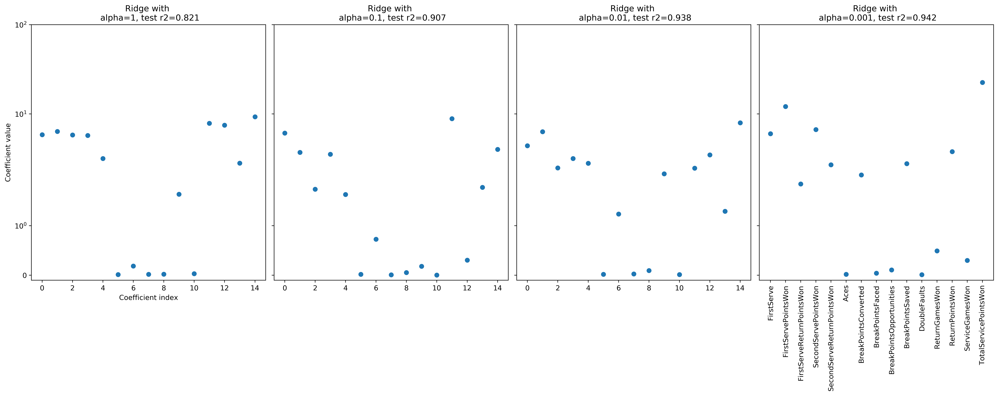

In [137]:
#Peform multiple Ridges to find the best alpha
k_folds = model_selection.KFold(n_splits=10,shuffle=True)
#alphas = np.logspace(-5,1, num=4)
alphas = [1,0.1,0.01,0.001]
fig, axes = plt.subplots(1,len(alphas), figsize=(20, 8), sharey=True)
for i, alpha in enumerate(alphas):
   ax = axes.flat[i]
   est = linear_model.Ridge(alpha=alpha, normalize=True)
   cv_result = model_selection.cross_validate(
       est, X=X, y=y, cv=k_folds, return_train_score=True)
   est.fit(X_train, y_train)
   print(est.coef_)
   coefs = np.abs(est.coef_)
   r2 = np.mean(cv_result["test_score"])
   ax.scatter(np.arange(len(coefs)), coefs)
   plt.xticks(np.arange(len(coefs)), X.columns, rotation=90)
   ax.set_title(f"Ridge with \n alpha={round(alpha,3)}, test r2={round(r2,3)}")
   
ax = axes.flat[0]
ax.set_yscale("symlog")
ax.set_ylim((-.1, 1e2))
ax.set_ylabel("Coefficient value")
ax.set_xlabel("Coefficient index")

plt.tight_layout()

In [138]:
est = linear_model.Ridge(alpha=0.001, normalize=True)
cv_result = model_selection.cross_validate(
   est, X=X, y=y, cv=k_folds, return_train_score=True)
est.fit(X_train, y_train)
coefs = np.abs(est.coef_)
list(zip(coefs,X.columns))

[(5.989887448498458, 'FirstServe'),
 (12.094852639089833, 'FirstServePointsWon'),
 (1.841935092336757, 'FirstServeReturnPointsWon'),
 (6.663382245554256, 'SecondServePointsWon'),
 (2.6837094368917653, 'SecondServeReturnPointsWon'),
 (0.017159593525929905, 'Aces'),
 (2.062603681368934, 'BreakPointsConverted'),
 (0.04059260062598787, 'BreakPointsFaced'),
 (0.10793541153193474, 'BreakPointsOpportunities'),
 (2.7664133688851953, 'BreakPointsSaved'),
 (0.010350646649560596, 'DoubleFaults'),
 (0.4913484385335612, 'ReturnGamesWon'),
 (3.769395654190377, 'ReturnPointsWon'),
 (0.30009084198086905, 'ServiceGamesWon'),
 (22.498747038284282, 'TotalServicePointsWon')]

### Lasso Regularization

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0.         0.         0.         0.         0.         0.00538492
 0.         0.         0.05968823 0.         0.         0.
 0.         0.         0.        ]
[ 0.          0.         -0.          0.         -0.          0.01527798
  0.         -0.          0.07109735  0.         -0.          0.
 -0.          0.          0.        ]
[ 1.47558704 -0.         -0.02020767 -0.78618558 -1.6519742   0.01663393
  1.4625507  -0.03731254  0.10450319  1.92088168 -0.00807938 -0.
 -5.35277276 -0.         -0.13209841]


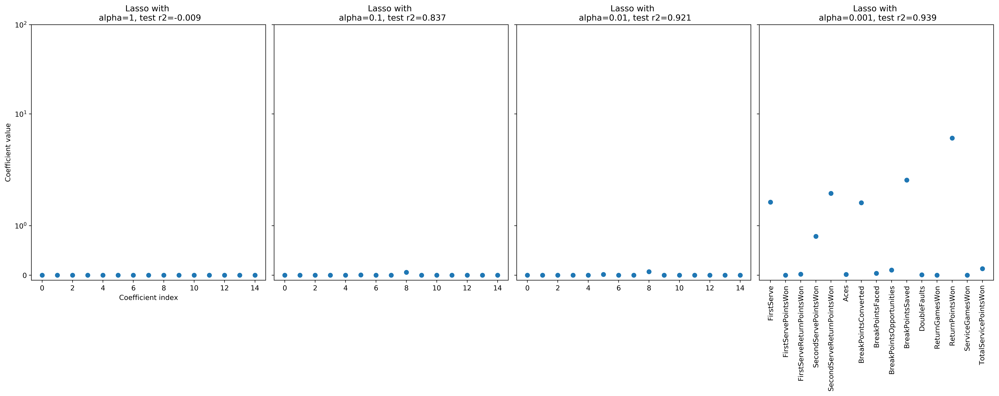

In [139]:
#Peform multiple Ridges to find the best alpha
k_folds = model_selection.KFold(n_splits=10,shuffle=True)
#alphas = np.logspace(-5,1, num=4)
alphas = [1,0.1,0.01,0.001]
fig, axes = plt.subplots(1,len(alphas), figsize=(20, 8), sharey=True)
for i, alpha in enumerate(alphas):
   ax = axes.flat[i]
   est = linear_model.Lasso(alpha=alpha, normalize=True)
   cv_result = model_selection.cross_validate(
       est, X=X, y=y, cv=k_folds, return_train_score=True)
   est.fit(X_train, y_train)
   print(est.coef_)
   coefs = np.abs(est.coef_)
   r2 = np.mean(cv_result["test_score"])
   ax.scatter(np.arange(len(coefs)), coefs)
   plt.xticks(np.arange(len(coefs)), X.columns, rotation=90)
   ax.set_title(f"Lasso with \n alpha={round(alpha,3)}, test r2={round(r2,3)}")
   
ax = axes.flat[0]
ax.set_yscale("symlog")
ax.set_ylim((-.1, 1e2))
ax.set_ylabel("Coefficient value")
ax.set_xlabel("Coefficient index")

plt.tight_layout()

In [140]:
est = linear_model.Lasso(alpha=0.001, normalize=True)
cv_result = model_selection.cross_validate(
   est, X=X, y=y, cv=k_folds, return_train_score=True)
est.fit(X_train, y_train)
coefs = np.abs(est.coef_)
list(zip(coefs,X.columns))

[(1.4755870397386597, 'FirstServe'),
 (0.0, 'FirstServePointsWon'),
 (0.020207672905177686, 'FirstServeReturnPointsWon'),
 (0.7861855789015771, 'SecondServePointsWon'),
 (1.6519742009772098, 'SecondServeReturnPointsWon'),
 (0.016633931376763115, 'Aces'),
 (1.462550701433805, 'BreakPointsConverted'),
 (0.037312540980431914, 'BreakPointsFaced'),
 (0.10450318984387008, 'BreakPointsOpportunities'),
 (1.9208816839419647, 'BreakPointsSaved'),
 (0.008079375539282143, 'DoubleFaults'),
 (0.0, 'ReturnGamesWon'),
 (5.35277275554552, 'ReturnPointsWon'),
 (0.0, 'ServiceGamesWon'),
 (0.13209841244334286, 'TotalServicePointsWon')]

### Elastic Net Regularization

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0.00000000e+00 8.76505855e-01 7.22529409e-01 7.25448169e-01
 4.13843517e-01 7.60241110e-04 0.00000000e+00 1.15137773e-03
 1.06963146e-03 3.21142394e-01 2.25788420e-03 6.60703331e-01
 9.82324277e-01 5.63442657e-01 1.29718470e+00]
[2.10723654e+00 5.91872594e+00 5.61972498e+00 5.12795822e+00
 3.55917104e+00 5.61175605e-03 4.70285129e-01 8.23565874e-03
 7.92187024e-03 2.37007847e+00 1.59265415e-02 4.97001143e+00
 7.13735972e+00 3.53078671e+00 8.32201889e+00]
[ 6.27460579  5.4072283   4.46368464  5.19439826  2.18496061  0.01471951
 -0.34614543  0.01807484  0.02509755  0.99149683  0.02930425  8.00568288
  6.111628    1.93874836  8.31670682]


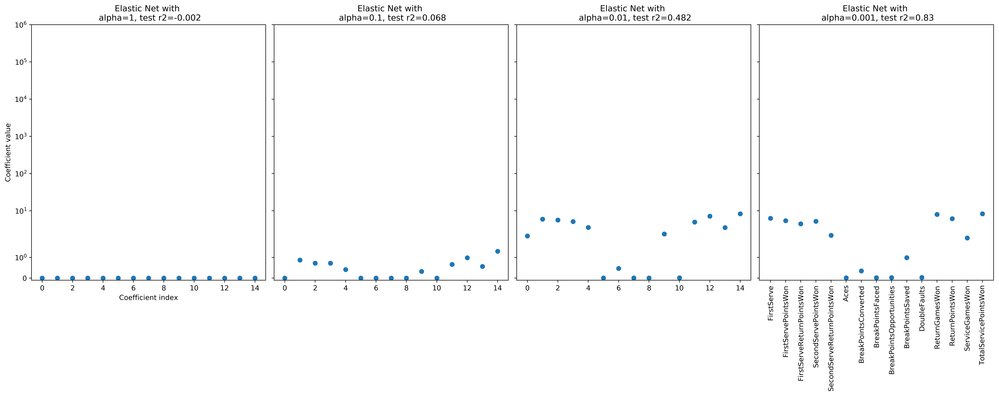

In [141]:
#Peform multiple Ridges to find the best alpha
k_folds = model_selection.KFold(n_splits=10,shuffle=True)
#alphas = np.logspace(-5,1, num=4)
alphas = [1,0.1,0.01,0.001]
fig, axes = plt.subplots(1,len(alphas), figsize=(20, 8), sharey=True)
for i, alpha in enumerate(alphas):
   ax = axes.flat[i]
   est = linear_model.ElasticNet(alpha=alpha, normalize=True)
   cv_result = model_selection.cross_validate(
       est, X=X, y=y, cv=k_folds, return_train_score=True)
   est.fit(X_train, y_train)
   print(est.coef_)
   coefs = np.abs(est.coef_)
   r2 = np.mean(cv_result["test_score"])
   ax.scatter(np.arange(len(coefs)), coefs)
   plt.xticks(np.arange(len(coefs)), X.columns, rotation=90)
   ax.set_title(f"Elastic Net with \n alpha={round(alpha,3)}, test r2={round(r2,3)}")
   
ax = axes.flat[0]
ax.set_yscale("symlog")
ax.set_ylim((-.1, 1e6))
ax.set_ylabel("Coefficient value")
ax.set_xlabel("Coefficient index")

plt.tight_layout()

In [142]:
est = linear_model.ElasticNet(alpha=0.001, normalize=True)
cv_result = model_selection.cross_validate(
   est, X=X, y=y, cv=k_folds, return_train_score=True)
est.fit(X_train, y_train)
coefs = np.abs(est.coef_)
list(zip(coefs,X.columns))

[(6.27460578733969, 'FirstServe'),
 (5.407228299927971, 'FirstServePointsWon'),
 (4.463684643217779, 'FirstServeReturnPointsWon'),
 (5.194398263444447, 'SecondServePointsWon'),
 (2.1849606106295845, 'SecondServeReturnPointsWon'),
 (0.014719509044248813, 'Aces'),
 (0.3461454280346503, 'BreakPointsConverted'),
 (0.018074837299681734, 'BreakPointsFaced'),
 (0.02509754697937578, 'BreakPointsOpportunities'),
 (0.9914968338701619, 'BreakPointsSaved'),
 (0.029304247789123973, 'DoubleFaults'),
 (8.005682880656169, 'ReturnGamesWon'),
 (6.111628003890219, 'ReturnPointsWon'),
 (1.9387483639372622, 'ServiceGamesWon'),
 (8.316706816942515, 'TotalServicePointsWon')]

### Pipeline, Selek K best with selected features

In [143]:
X = df.loc[:,selected_features]
y = df.loc[:,wins]

In [144]:
select_pipe = pipeline.Pipeline(
    #preprocess data
    [("imp", preprocessing.Imputer()), 
     #scale features
     ("std", preprocessing.StandardScaler()),
     #select k best
     ("select",
      feature_selection.SelectKBest(
          score_func=feature_selection.f_regression)), 
     #use linear regression
     ("lin", LinearRegression())
    ])

In [145]:
select_pipe.fit(X,y)
select_pipe.score(X,y)

0.9418023740764145

In [146]:
feat_support = select_pipe.named_steps["select"].get_support()
feat = X.columns[feat_support]
coef = select_pipe.named_steps["lin"].coef_

list(zip(feat, coef))

[('FirstServePointsWon', -0.06164197933434787),
 ('SecondServePointsWon', -0.07810629010569867),
 ('Aces', 3.351119643113633),
 ('BreakPointsFaced', -5.668945941934415),
 ('BreakPointsOpportunities', 18.11623509965193),
 ('DoubleFaults', -0.7942005671759232),
 ('ReturnGamesWon', 0.2823363612982434),
 ('ReturnPointsWon', -0.5474447952280076),
 ('ServiceGamesWon', 0.4181848838599053),
 ('TotalServicePointsWon', -0.32090932033302944)]

In [147]:
cv_result = model_selection.cross_validate(
        select_pipe, X=X, y=y, cv=10, return_train_score=True)
print(f"train: {np.mean(cv_result['train_score']):.3}, test: {np.mean(cv_result['test_score']):.3}")

train: 0.942, test: 0.925


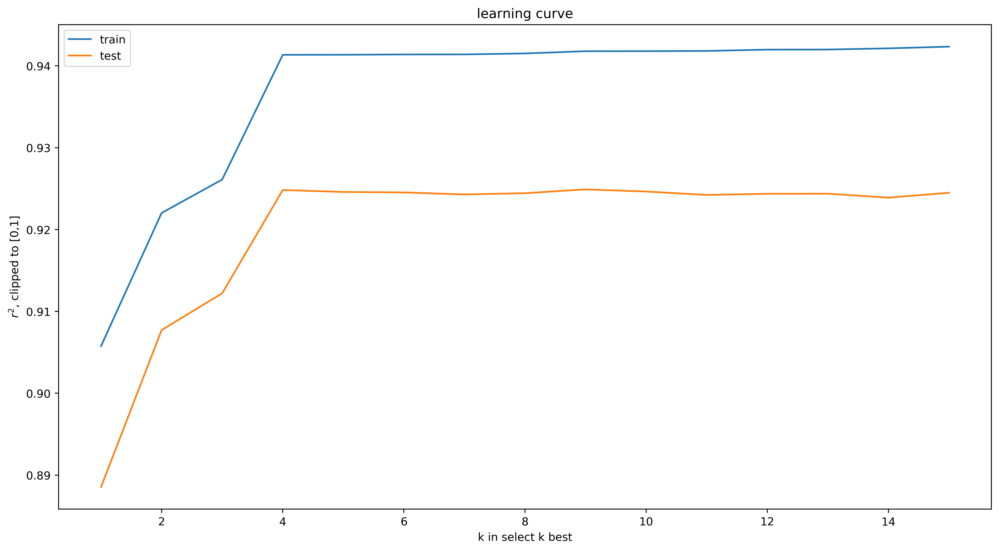

In [148]:
plt.figure(figsize=(15, 8))


train_scores = []
test_scores = []
# define feature range
num_feats = len(X.columns)
feat_range = np.arange(num_feats)+1
# for each k in feat_range
for num_f in feat_range:
    # set pipeline params
    select_pipe.set_params(select__k=num_f)
    # get cross val scores
    cv_result = model_selection.cross_validate(
        select_pipe, X=X, y=y, cv=10, return_train_score=True)
    train_scores.append(np.maximum(np.mean(cv_result['train_score']), 0))
    test_scores.append(np.maximum(np.mean(cv_result['test_score']), 0))

# plot test vs train
plt.plot(feat_range, train_scores, label="train")
plt.plot(feat_range, test_scores, label="test")

# find index of best score
best_i = np.argmax(test_scores)
# annotate score
# ann_xy = (feat_range[best_i], test_scores[best_i])
# ann_text = f"$r^2$={test_scores[best_i]:.2}, $k$={feat_range[best_i]}"
# annotate(ann_text, xy=ann_xy, xytext=(.6,.4), textcoords='axes fraction',
#             arrowprops=dict(arrowstyle="->"),
#             )

plt.xlabel("k in select k best")
plt.ylabel("$r^2$, clipped to [0,1]")
plt.title("learning curve")
plt.legend()

In [149]:
best_i

8

In [150]:
test_scores

[0.8885477515393774,
 0.9077239962204455,
 0.9122145090056799,
 0.9248320962251496,
 0.9245937710949509,
 0.9245352208128242,
 0.9242920128925537,
 0.9244446624498769,
 0.9249059782098671,
 0.9246446821570938,
 0.9242322632645733,
 0.9243705953779184,
 0.9243833034410928,
 0.9239008649301045,
 0.9244927362038723]